In [25]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.sans-serif'] = ['Times New Roman']
plt.rcParams['figure.dpi'] = 500
plt.rcParams['text.color'] = 'w'
plt.rcParams['axes.labelcolor'] = 'w'
plt.rcParams['xtick.color'] = 'w'
plt.rcParams['ytick.color'] = 'w'
plt.rcParams['axes.edgecolor'] = 'w'
plt.rcParams['figure.facecolor'] = 'k'
plt.rcParams['axes.facecolor'] = 'k'
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.colors import LogNorm
from matplotlib.patches import FancyArrowPatch
import matplotlib.colors as colors
from astropy.visualization import SqrtStretch, LinearStretch, LogStretch
from astropy.visualization.mpl_normalize import ImageNormalize
import pandas as pd
import re
from astropy.io import fits
import os
from scipy.ndimage import map_coordinates
from scipy.stats import binned_statistic
from scipy.spatial.distance import cdist
from scipy.optimize import linear_sum_assignment
from pathlib import Path
from scipy.stats import gaussian_kde
import seaborn as sns

from matplotlib.lines import Line2D
os.chdir("/Users/ainsleylewis/Documents/Astronomy/IllustrisTNG Lens Modelling")

In [9]:
columns = ['strength', 'pa', 'num_images', 'pos_rms', 'mag_rms', 't_mpole_str', 't_mpole_pa', 'chi2', 'z', 'x', 'y', 'e', 'pow_pa', 'r_ein', 'pwi']
df = pd.read_csv('/Users/ainsleylewis/Documents/Astronomy/IllustrisTNG Lens Modelling/Test/Sim 10_summary.csv', header=None, names=columns, skiprows=1) 
df

,strength,pa,num_images,pos_rms,mag_rms,t_mpole_str,t_mpole_pa,chi2,z,x,y,e,pow_pa,r_ein,pwi
0,0.001,0.00000,0,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,0.00000,0.00000,0.000000e+00,0.000000,0.000000,0.000000
1,0.001,0.36036,2,0.586094,406692.15825,0.000002,-32.676230,586.470100,1.0,20.80800,20.77519,3.243274e-07,85.655710,0.487855,1.502942
2,0.001,0.72072,8,NaN,NaN,0.009153,0.321549,0.000002,1.0,20.80973,20.78384,2.428864e-02,170.710900,0.491122,1.502595
3,0.001,1.08108,8,NaN,NaN,0.064055,-3.066936,0.000003,1.0,20.80984,20.81364,1.222924e-02,29.932690,0.495335,1.971658
4,0.001,1.44144,9,NaN,NaN,0.017955,-1.991766,144.997600,1.0,20.80797,20.80005,5.976250e-09,104.616700,0.493283,1.532596
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999995,0.100,358.19820,8,NaN,NaN,0.085305,357.278900,0.000003,1.0,20.81024,20.80457,3.154899e-02,5.355434,0.494440,2.292411
999996,0.100,358.55856,8,NaN,NaN,0.093393,357.366000,0.000002,1.0,20.81034,20.80282,4.316221e-02,2.706225,0.494334,2.385432
999997,0.100,358.91892,8,NaN,NaN,0.083411,357.393700,0.000002,1.0,20.81024,20.80295,3.880312e-02,2.180373,0.494210,2.304147
999998,0.100,359.27928,8,NaN,NaN,0.103699,357.017400,0.000003,1.0,20.81041,20.80798,2.048553e-02,24.875420,0.495172,2.373869


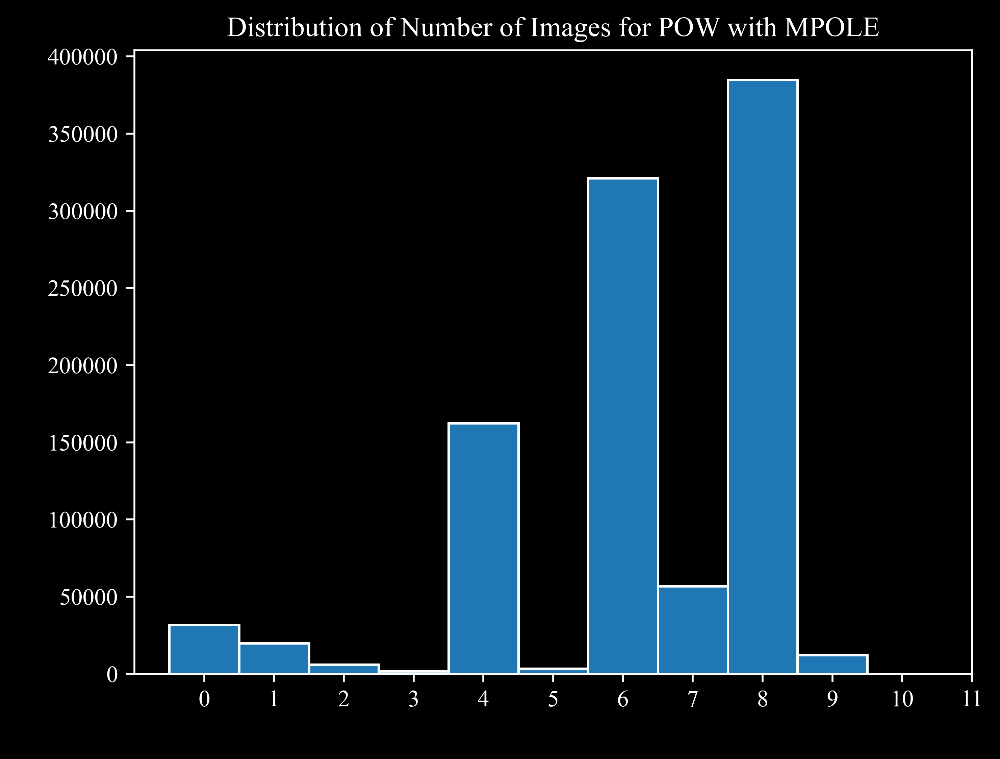

In [10]:
plt.hist(df['num_images'], bins=range(0, 11), align='left', edgecolor='w')
plt.xlabel('Number of Images')
plt.ylabel('Frequency')
plt.title('Distribution of Number of Images for POW with MPOLE')
plt.xticks([0,1,2,3,4,5,6,7,8,9,10,11])
plt.show()

In [11]:
mask = df['num_images'] == 4
filtered_df_0 = df[mask]
filtered_df_0 = filtered_df_0.reset_index(drop=True)

# Precentage of 4 image models 
percentage_4_images = (len(filtered_df_0) / len(df)) * 100
print(f"Percentage of 4 image models: {percentage_4_images:.2f}%")

Percentage of 4 image models: 16.23%


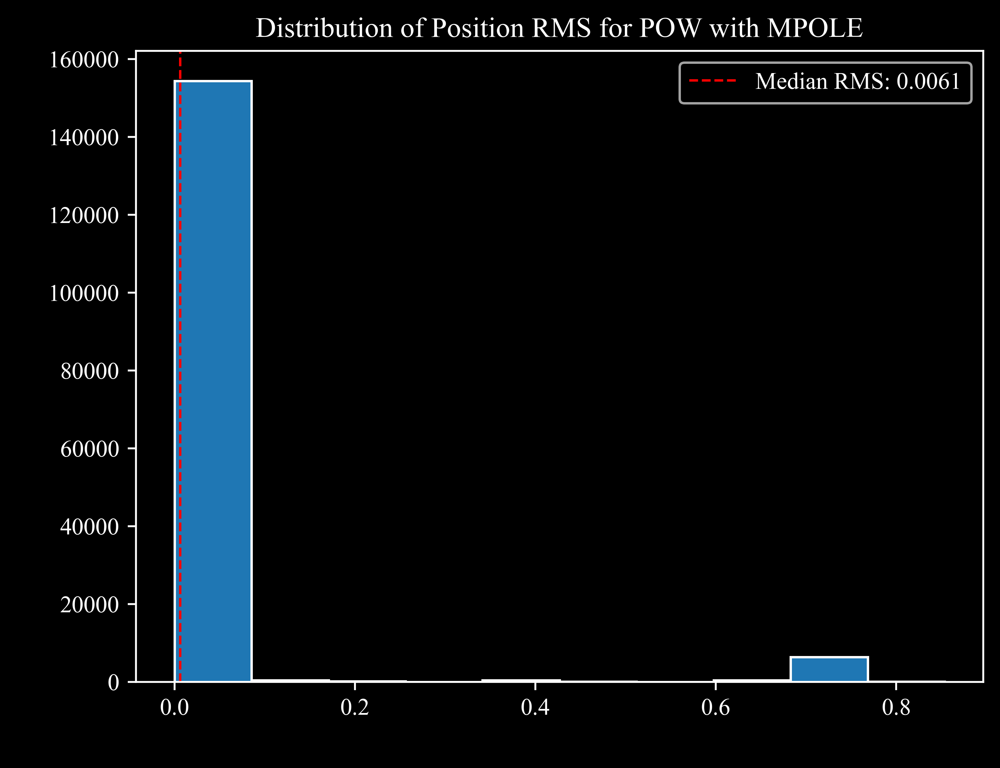

In [12]:
plt.hist(filtered_df_0['pos_rms'], bins=10, edgecolor='w')
plt.axvline(filtered_df_0['pos_rms'].median(), color='r', linestyle='dashed', linewidth=1, label='Median RMS: ' + str(round(filtered_df_0['pos_rms'].median(), 4)))
plt.xlabel('Position RMS')
plt.ylabel('Frequency')
plt.legend()
plt.title('Distribution of Position RMS for POW with MPOLE')
plt.show()

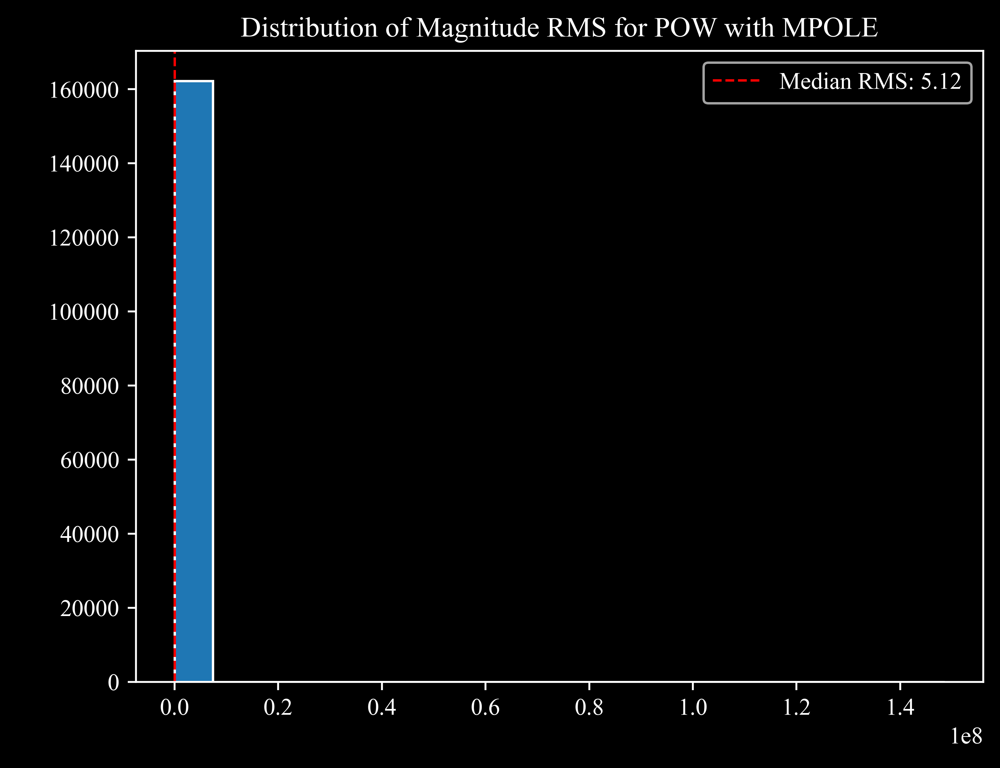

In [13]:
plt.hist(filtered_df_0['mag_rms'], bins=20, edgecolor='w')
plt.axvline(filtered_df_0['mag_rms'].median(), color='r', linestyle='dashed', linewidth=1, label='Median RMS: ' + str(round(filtered_df_0['mag_rms'].median(), 2)))
plt.xlabel('Magnitude RMS')
plt.ylabel('Frequency')
plt.legend()
plt.title('Distribution of Magnitude RMS for POW with MPOLE')
plt.show()

In [14]:
mask2 = filtered_df_0['pos_rms']  == 3.101229586803652e-05
filtered_df = filtered_df_0[mask2]
filtered_df = filtered_df.reset_index(drop=True)
filtered_df

,strength,pa,num_images,pos_rms,mag_rms,t_mpole_str,t_mpole_pa,chi2,z,x,y,e,pow_pa,r_ein,pwi
0,0.0011,13.33333,4,0.000031,6.506000,0.057303,49.69120,0.000002,1.0,20.79289,20.70752,0.514376,180.163800,0.501723,2.343238
1,0.0012,69.90991,4,0.000031,11.326400,0.055895,52.25379,0.000002,1.0,20.79198,20.71605,0.491806,1.229049,0.499793,2.350702
2,0.0013,12.25225,4,0.000031,8.439000,0.055498,140.62900,0.000003,1.0,20.79259,20.71181,0.491243,180.643900,0.500325,2.335159
3,0.0013,332.25225,4,0.000031,17.417475,0.056238,323.06610,0.000003,1.0,20.79159,20.71843,0.484467,1.630468,0.499264,2.351460
4,0.0014,8.28829,4,0.000031,23.165125,0.060315,-34.99752,0.000003,1.0,20.79077,20.72195,0.507025,182.201200,0.499558,2.385762
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1558,0.0998,210.09009,4,0.000031,8.622975,0.055395,230.66020,0.000003,1.0,20.79257,20.71200,0.489548,0.668366,0.500244,2.334120
1559,0.0998,289.00901,4,0.000031,10.110200,0.056120,322.13340,0.000002,1.0,20.79206,20.71542,0.497709,1.125866,0.500067,2.354444
1560,0.0998,291.89189,4,0.000031,8.948500,0.057591,322.86790,0.000002,1.0,20.79187,20.71620,0.518446,1.186723,0.500685,2.377444
1561,0.0998,338.37838,4,0.000031,11.156625,0.056218,322.46280,0.000003,1.0,20.79191,20.71637,0.495567,1.270466,0.499877,2.355595


In [15]:
# Percentage Calc
num_goodfit = len(filtered_df)
num_total = len(df[df['num_images'] == 4])
percentage_goodfit = (num_goodfit / num_total) * 100
print(f"Percentage of good fits out of 4 image models: {percentage_goodfit:.2f}%")

num_goodfit = len(filtered_df)
num_total = len(df)
percentage_goodfit = (num_goodfit / num_total) * 100
print(f"Percentage of good fits: {percentage_goodfit:.2f}%")

Percentage of good fits out of 4 image models: 0.96%
Percentage of good fits: 0.16%


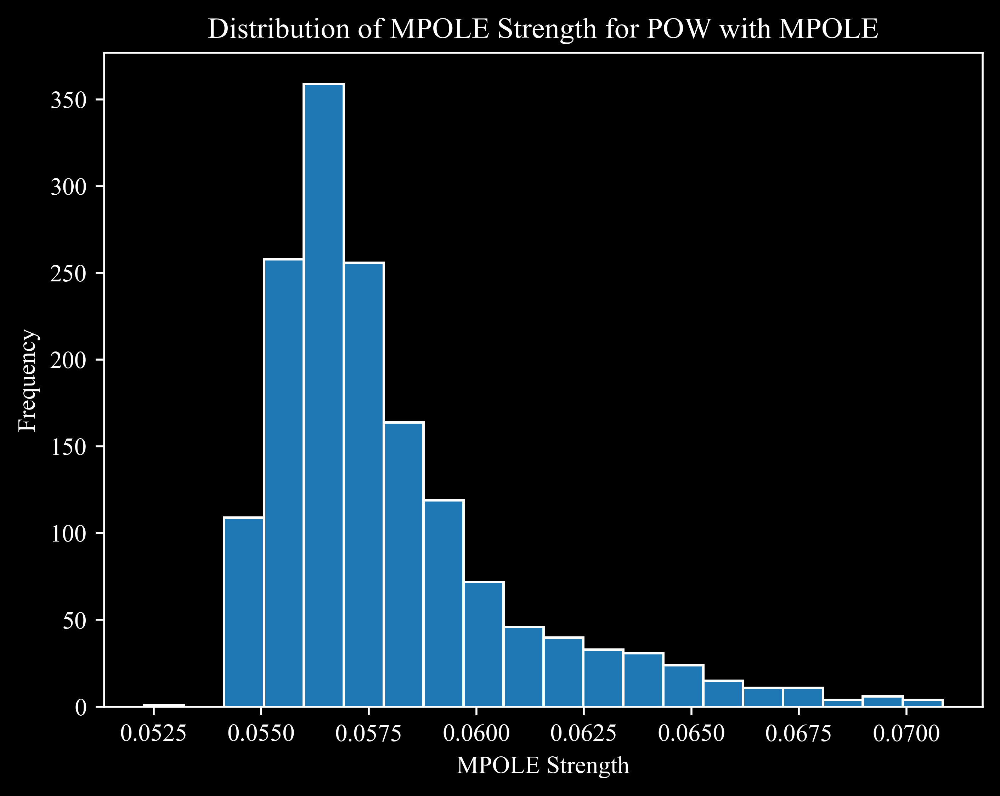

In [11]:
plt.hist(filtered_df['t_mpole_str'], bins=20, edgecolor='w')
plt.xlabel('MPOLE Strength', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of MPOLE Strength for POW with MPOLE')
plt.show()

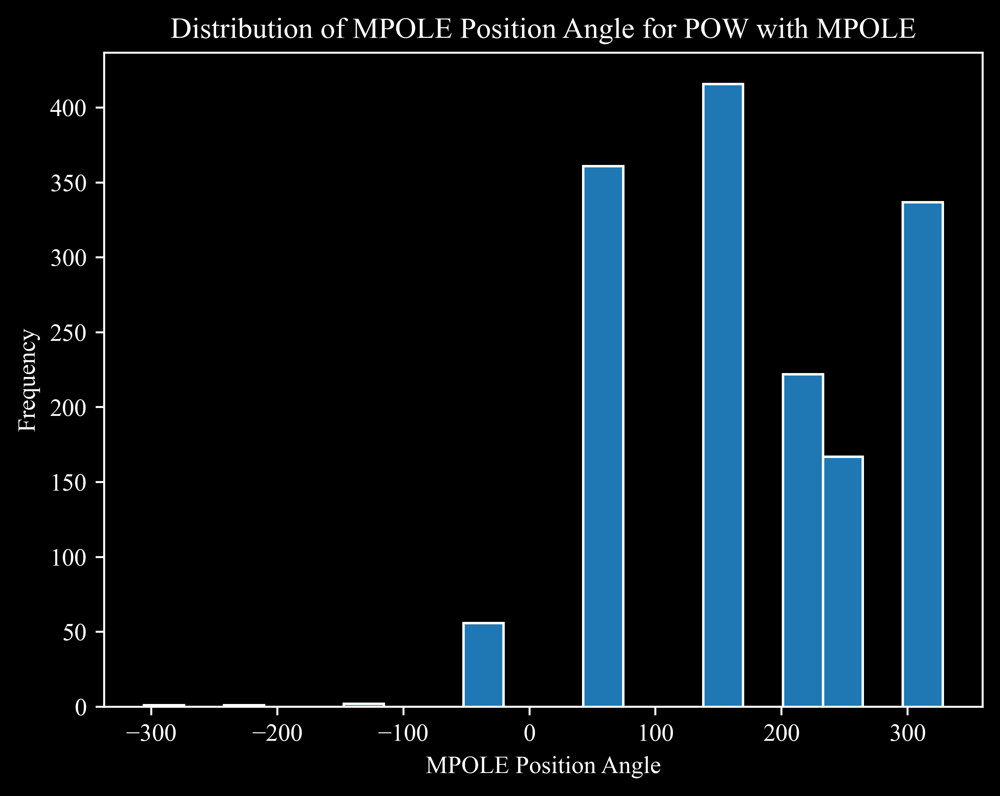

In [12]:
plt.hist(filtered_df['t_mpole_pa'], bins=20, edgecolor='w')
plt.xlabel('MPOLE Position Angle', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of MPOLE Position Angle for POW with MPOLE')
plt.show()

In [13]:
aligned_pa = (filtered_df['t_mpole_pa'] > 100) & (filtered_df['t_mpole_pa'] < 200)
num_aligned = len(filtered_df[aligned_pa])
print(f"Number of aligned MPOLE position angles: {num_aligned}")
anti_aligned_pa = (filtered_df['t_mpole_pa'] < 0) | (filtered_df['t_mpole_pa'] > 200)
print(f"Number of anti-aligned MPOLE position angles: {len(filtered_df[anti_aligned_pa])}")

# Percentage
percentage_aligned = (num_aligned / len(filtered_df)) * 100
print(f"Percentage of aligned MPOLE position angles: {percentage_aligned:.2f}%")
percentage_anti_aligned = (len(filtered_df[anti_aligned_pa]) / len(filtered_df)) * 100
print(f"Percentage of anti-aligned MPOLE position angles: {percentage_anti_aligned:.2f}%")

Number of aligned MPOLE position angles: 416
Number of anti-aligned MPOLE position angles: 786
Percentage of aligned MPOLE position angles: 26.62%
Percentage of anti-aligned MPOLE position angles: 50.29%


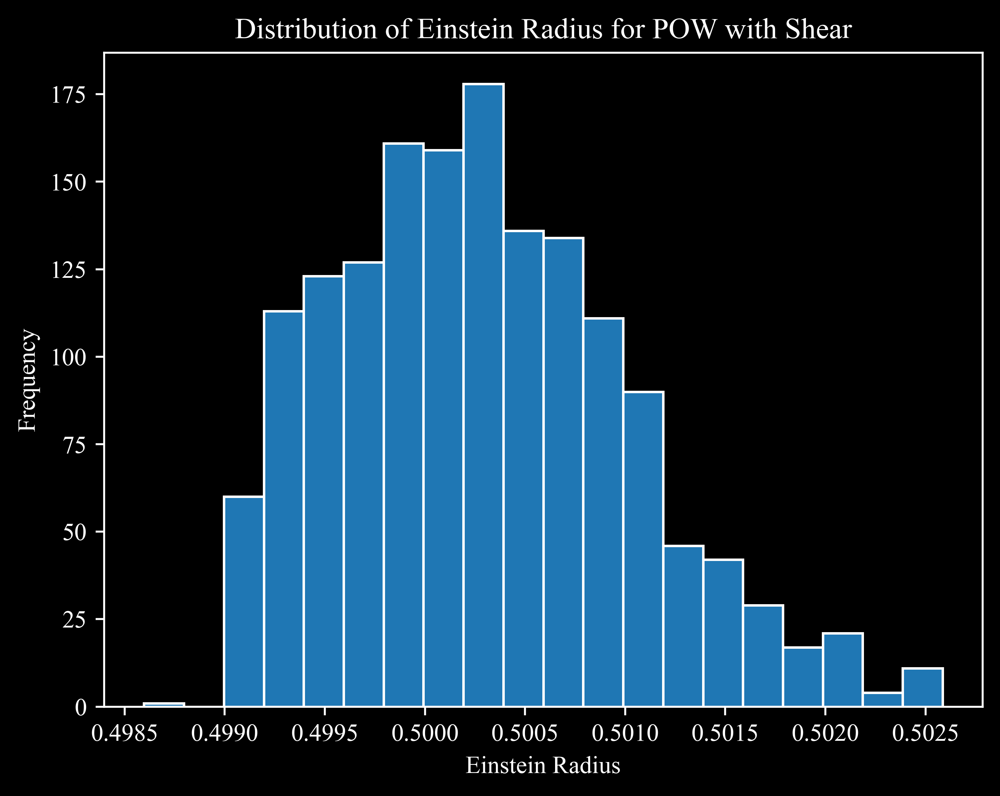

In [14]:
plt.hist(filtered_df['r_ein'], bins=20, edgecolor='w')
plt.xlabel('Einstein Radius', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of Einstein Radius for POW with Shear')
plt.show()

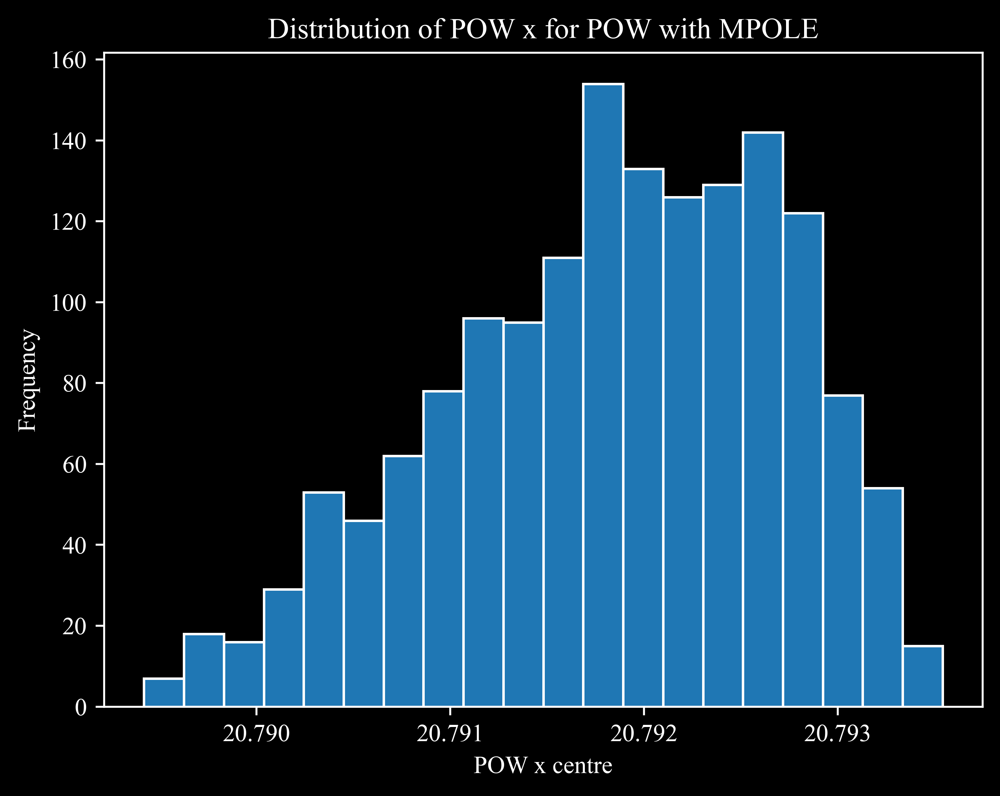

In [15]:
plt.hist(filtered_df['x'], bins=20, edgecolor='w')
plt.xlabel('POW x centre', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of POW x for POW with MPOLE')
plt.show()

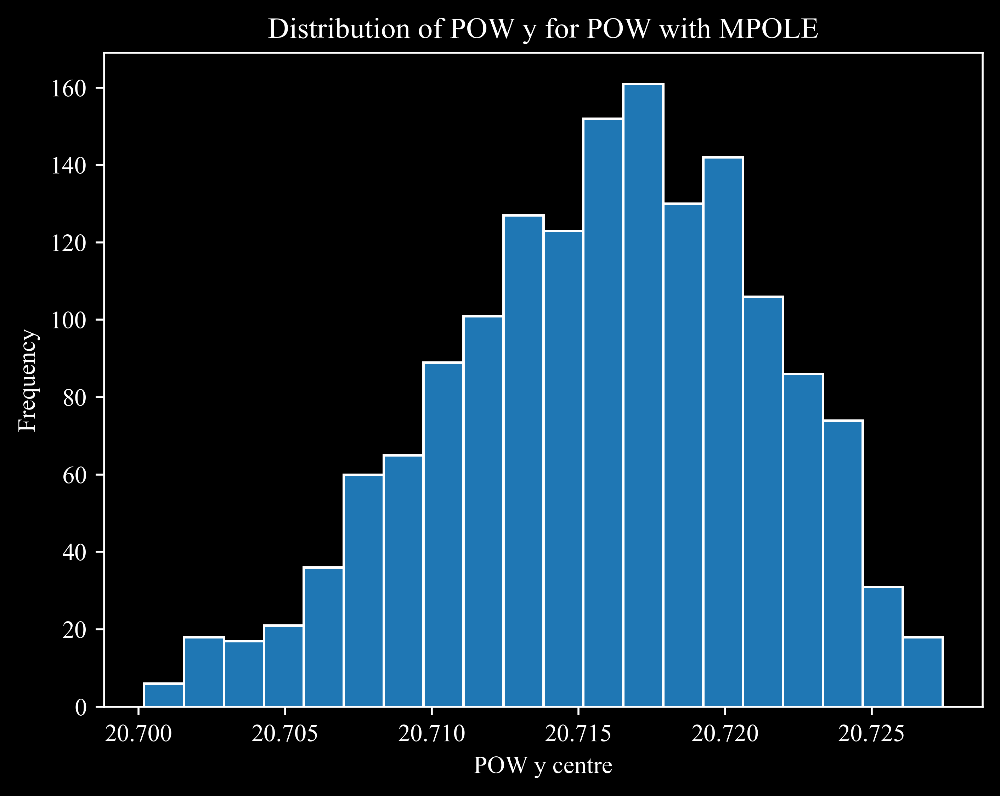

In [16]:
plt.hist(filtered_df['y'], bins=20, edgecolor='w')
plt.xlabel('POW y centre', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of POW y for POW with MPOLE')
plt.show()

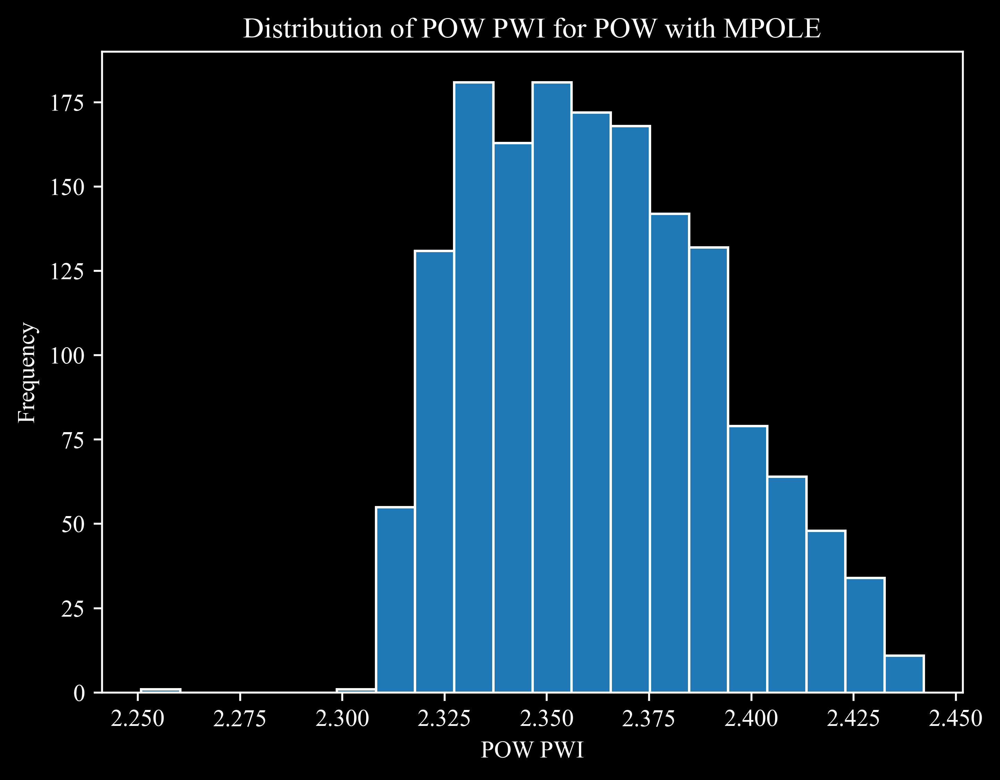

In [17]:
plt.hist(filtered_df['pwi'], bins=20, edgecolor='w')
plt.xlabel('POW PWI', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of POW PWI for POW with MPOLE')
plt.show()

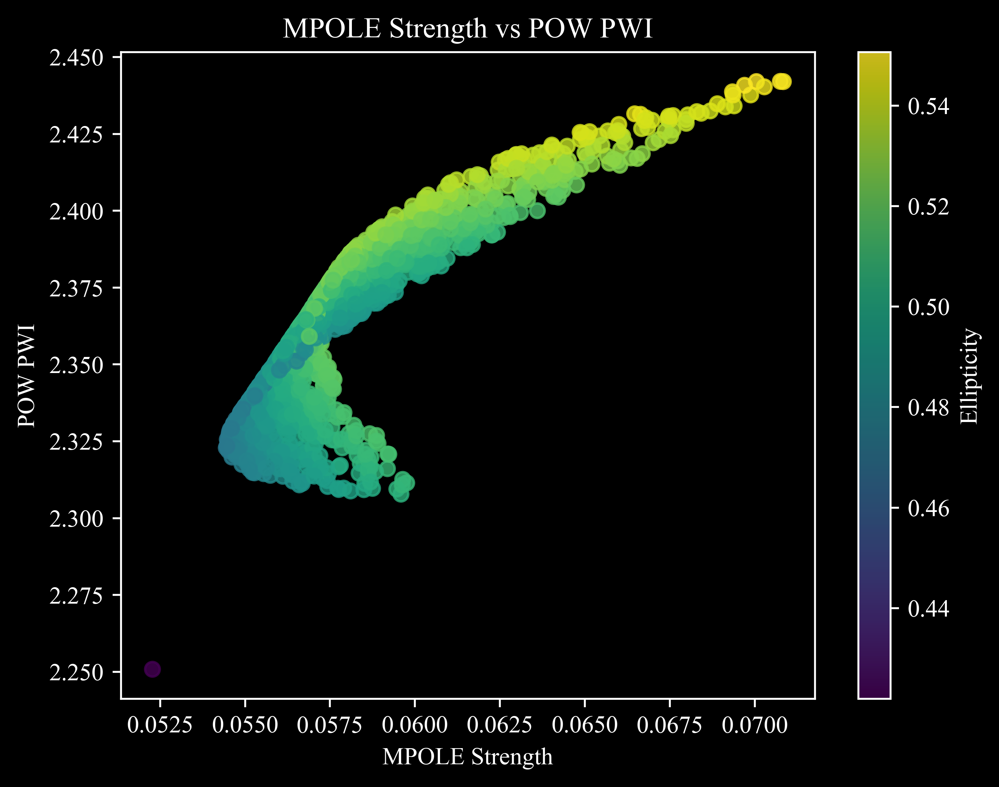

In [26]:
plt.scatter(filtered_df['t_mpole_str'], filtered_df['pwi'], c=filtered_df['e'], alpha=0.8)
plt.colorbar(label='Ellipticity')
plt.xlabel('MPOLE Strength', color = 'w')
plt.ylabel('POW PWI', color = 'w')
plt.title('MPOLE Strength vs POW PWI')
plt.show()

In [37]:
# import plotly.express as px
# import plotly.io as pio

# # Create the 3D scatter plot using plotly express
# fig = px.scatter_3d(filtered_df, 
#                     x='t_mpole_str', 
#                     y='pwi', 
#                     z='e',
#                     color='r_ein',
#                     opacity=1,
#                     title='MPOLE Strength vs POW PWI vs Ellipticity')

# # Update layout for dark theme, bigger size and smaller points
# fig.update_layout(
#     paper_bgcolor='black',
#     plot_bgcolor='black',
#     scene=dict(
#         xaxis_title='MPOLE Strength',
#         yaxis_title='POW PWI',
#         zaxis_title='Ellipticity',
#         bgcolor='black',
#         xaxis=dict(gridcolor='white', showbackground=False, color='white'),
#         yaxis=dict(gridcolor='white', showbackground=False, color='white'),
#         zaxis=dict(gridcolor='white', showbackground=False, color='white'),
#         aspectmode='cube'
#     ),
#     font=dict(color='white'),
#     width=1200,  # Increase width
#     height=1000  # Increase height
# )

# # Update marker size
# fig.update_traces(marker=dict(size=5))  # Decrease point size
# fig.write_html("/Users/ainsleylewis/Library/CloudStorage/OneDrive-TheUniversityofHongKong-Connect/Weird Plots/plot_26.html")

# fig.show()

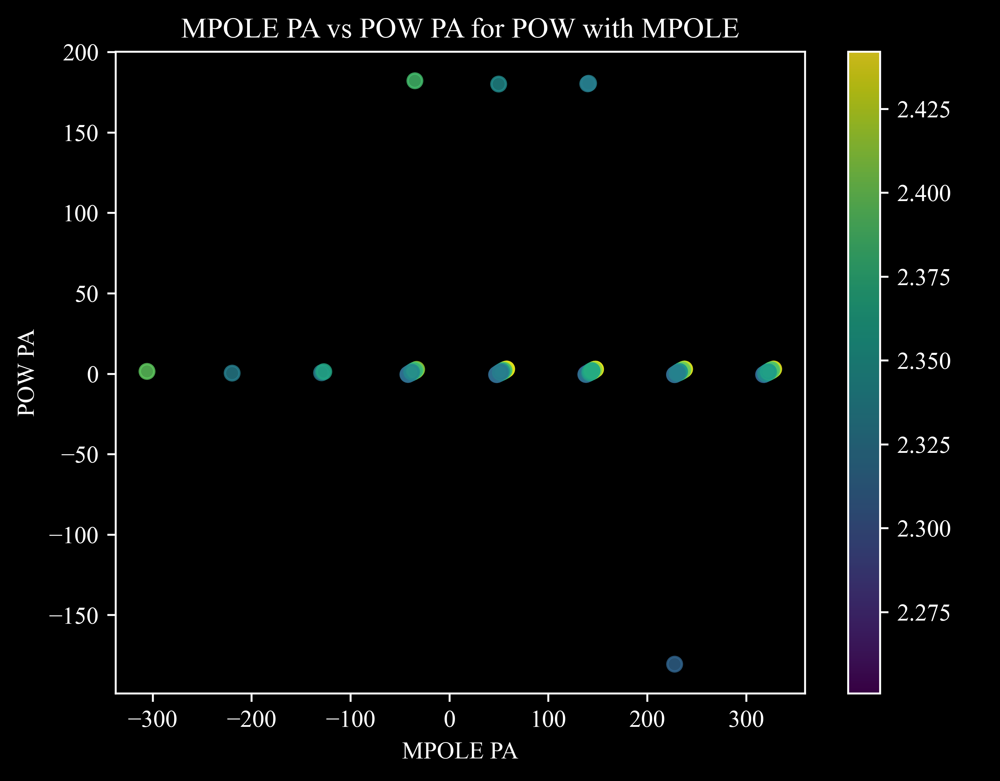

In [19]:
plt.scatter(filtered_df['t_mpole_pa'], filtered_df['pow_pa'], c=filtered_df['pwi'], alpha=0.8)
plt.colorbar(label='Ellipticity')
plt.xlabel('MPOLE PA', color = 'w')
plt.ylabel('POW PA', color = 'w')
plt.title('MPOLE PA vs POW PA for POW with MPOLE')
plt.show()

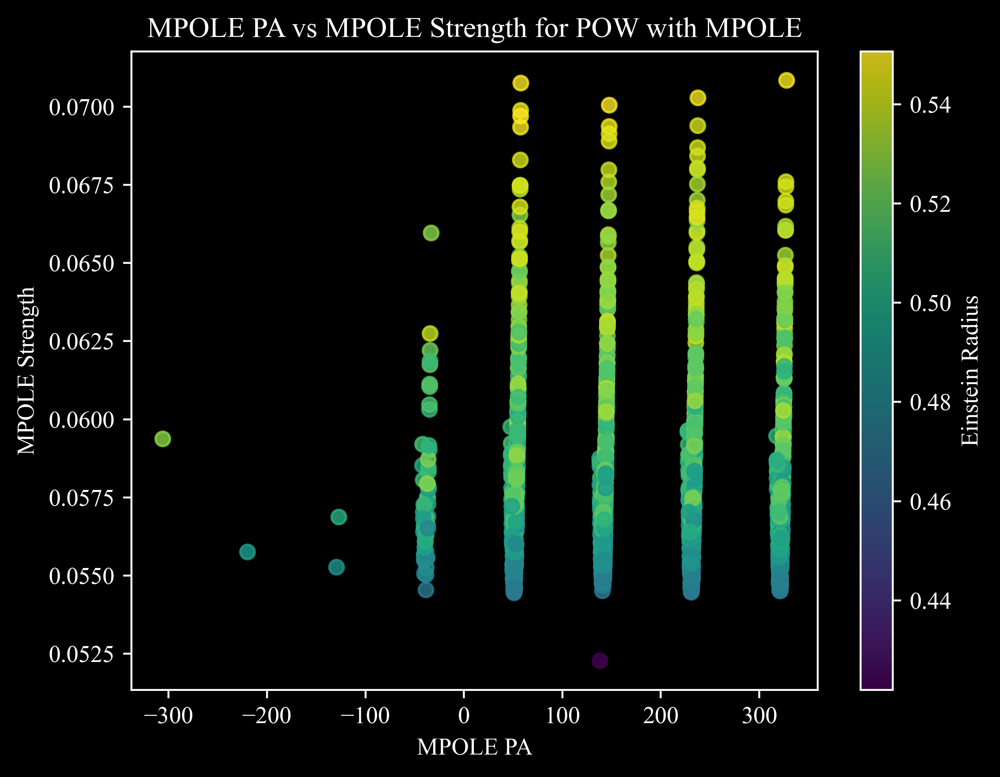

In [32]:
plt.scatter(filtered_df['t_mpole_pa'], filtered_df['t_mpole_str'], c=filtered_df['e'], alpha=0.8)
plt.colorbar(label='Einstein Radius')
plt.xlabel('MPOLE PA', color = 'w')
plt.ylabel('MPOLE Strength', color = 'w')
plt.title('MPOLE PA vs MPOLE Strength for POW with MPOLE')
plt.show()

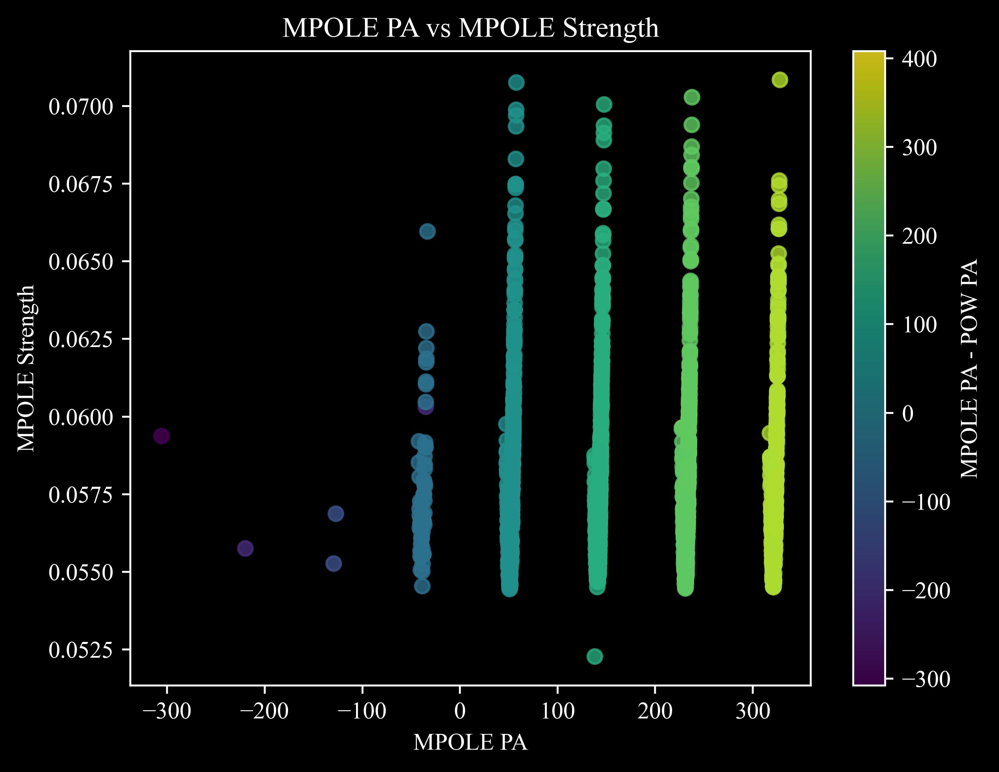

In [33]:
plt.scatter(filtered_df['t_mpole_pa'], filtered_df['t_mpole_str'], c=(filtered_df['t_mpole_pa'] - filtered_df['pow_pa']), alpha=0.8)
plt.colorbar(label='MPOLE PA - POW PA')
plt.xlabel('MPOLE PA', color = 'w')
plt.ylabel('MPOLE Strength', color = 'w')
plt.title('MPOLE PA vs MPOLE Strength')
plt.show()

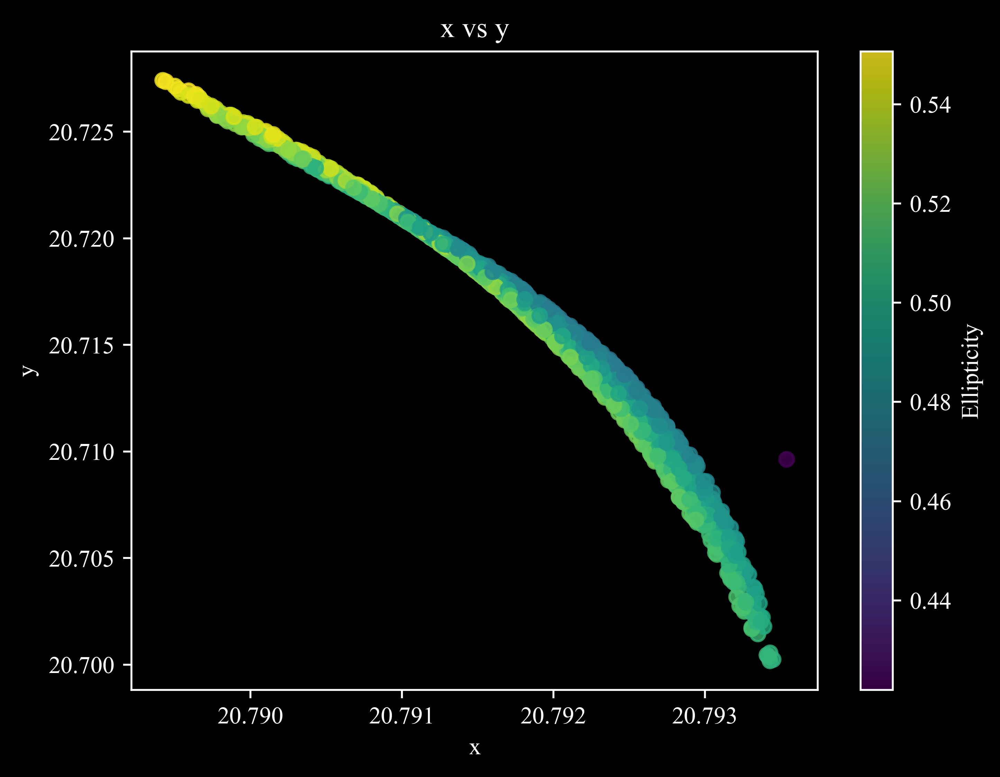

In [34]:
plt.scatter(filtered_df['x'], filtered_df['y'], c=filtered_df['e'], alpha=0.8)
plt.colorbar(label='Ellipticity')
plt.xlabel('x', color = 'w')
plt.ylabel('y', color = 'w')
plt.title('x vs y')
plt.show()

In [39]:
# # Create the 3D scatter plot using plotly express
# fig = px.scatter_3d(filtered_df, 
#                     x='x', 
#                     y='y', 
#                     z='e',
#                     color='r_ein',
#                     opacity=1,
#                     title='MPOLE Strength vs POW PWI vs Ellipticity')

# # Update layout for dark theme, bigger size and smaller points
# fig.update_layout(
#     paper_bgcolor='black',
#     plot_bgcolor='black',
#     scene=dict(
#         xaxis_title='x',
#         yaxis_title='y',
#         zaxis_title='Ellipticity',
#         bgcolor='black',
#         xaxis=dict(gridcolor='white', showbackground=False, color='white'),
#         yaxis=dict(gridcolor='white', showbackground=False, color='white'),
#         zaxis=dict(gridcolor='white', showbackground=False, color='white'),
#         aspectmode='cube'
#     ),
#     font=dict(color='white'),
#     width=1200,  # Increase width
#     height=1000  # Increase height
# )

# # Update marker size
# fig.update_traces(marker=dict(size=5))  # Decrease point size
# fig.write_html("/Users/ainsleylewis/Library/CloudStorage/OneDrive-TheUniversityofHongKong-Connect/Weird Plots/plot_29.html")

# fig.show()

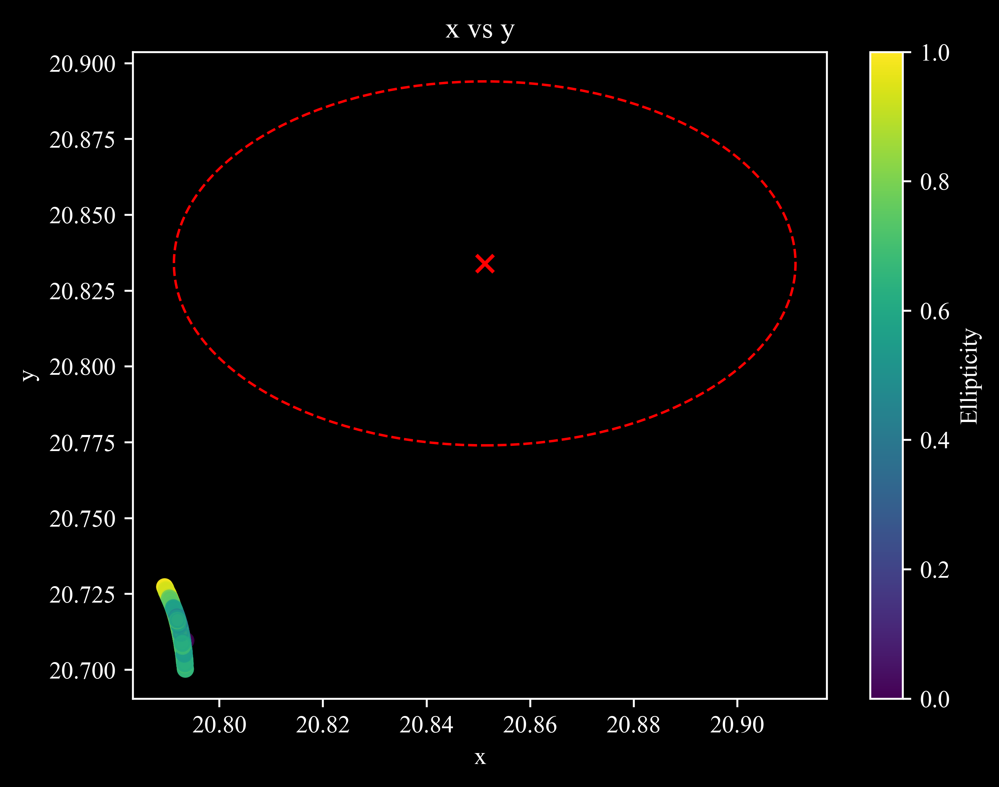

In [40]:
plt.scatter(filtered_df['x'], filtered_df['y'], c=filtered_df['e'], alpha=0.8)
plt.scatter(20.8512217, 20.8340052, c='r', marker='x', s=50, label='Light Center')
circle = plt.Circle((20.8512217, 20.8340052), radius=0.06, color='r', fill=False, linewidth=1, label='1 $\sigma$', linestyle='dashed')
plt.gca().add_patch(circle)
plt.colorbar(label='Ellipticity')
plt.xlabel('x', color = 'w')
plt.ylabel('y', color = 'w')
plt.title('x vs y')
plt.show()

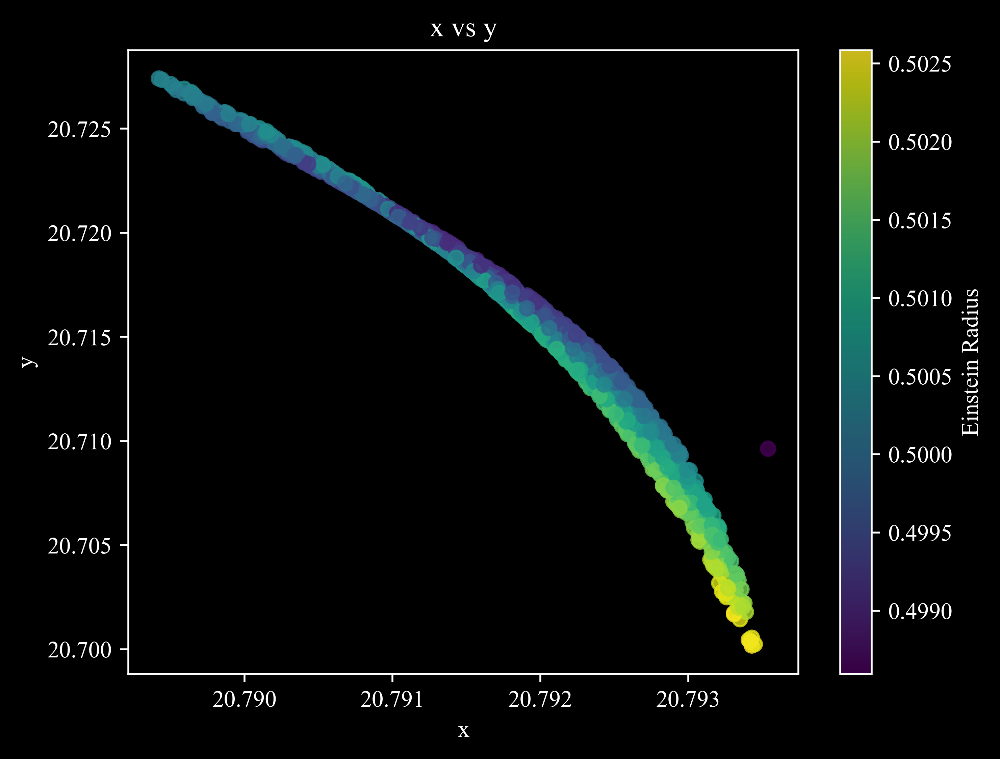

In [41]:
plt.scatter(filtered_df['x'], filtered_df['y'], c=filtered_df['r_ein'], alpha=0.8)
plt.colorbar(label='Einstein Radius')
plt.xlabel('x', color = 'w')
plt.ylabel('y', color = 'w')
plt.title('x vs y')
plt.show()

In [44]:
# # Create the 3D scatter plot using plotly express
# fig = px.scatter_3d(filtered_df, 
#                     x='x', 
#                     y='y', 
#                     z='r_ein',
#                     color='e',
#                     opacity=1,
#                     title='MPOLE Strength vs POW PWI vs Einstein Radius')

# # Update layout for dark theme, bigger size and smaller points
# fig.update_layout(
#     paper_bgcolor='black',
#     plot_bgcolor='black',
#     scene=dict(
#         xaxis_title='x',
#         yaxis_title='y',
#         zaxis_title='Einstein Radius',
#         bgcolor='black',
#         xaxis=dict(gridcolor='white', showbackground=False, color='white'),
#         yaxis=dict(gridcolor='white', showbackground=False, color='white'),
#         zaxis=dict(gridcolor='white', showbackground=False, color='white'),
#         aspectmode='cube'
#     ),
#     font=dict(color='white'),
#     width=1200,  # Increase width
#     height=1000  # Increase height
# )

# # Update marker size
# fig.update_traces(marker=dict(size=5))  # Decrease point size
# # fig.write_html("/Users/ainsleylewis/Library/CloudStorage/OneDrive-TheUniversityofHongKong-Connect/Weird Plots/plot_29.html")

# fig.show()

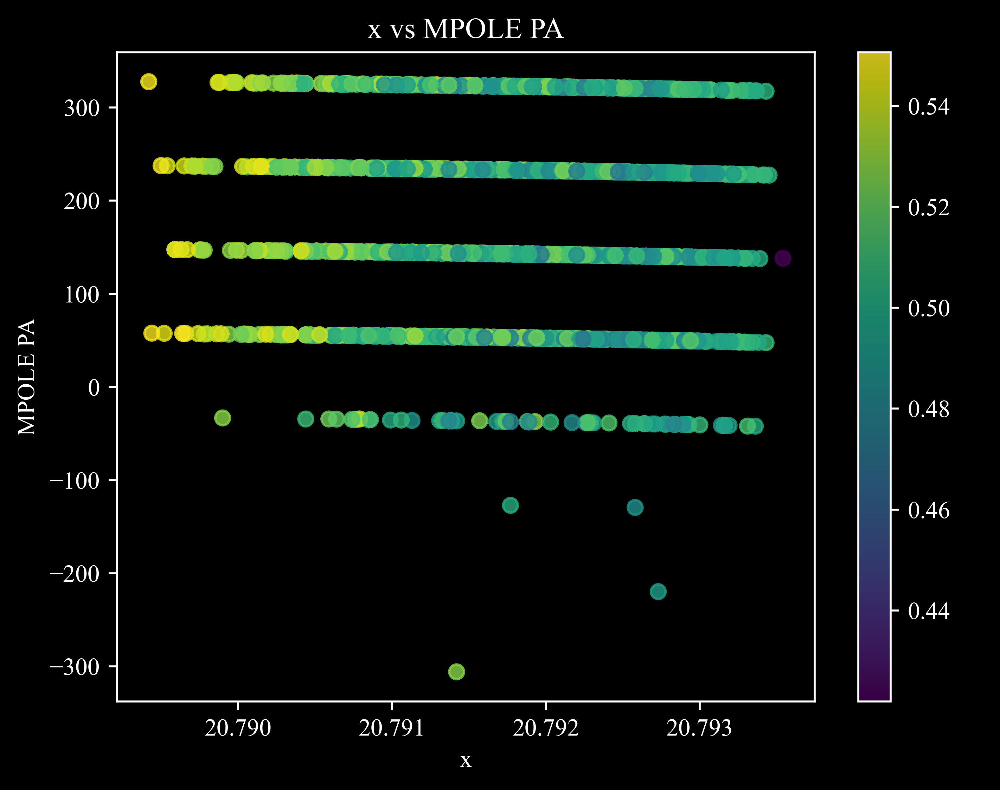

In [23]:
plt.scatter(filtered_df['x'], filtered_df['t_mpole_pa'], c=filtered_df['e'], alpha=0.8)
plt.colorbar(label='Ellipticity')
plt.xlabel('x', color = 'w')
plt.ylabel('MPOLE PA', color = 'w')
plt.title('x vs MPOLE PA')
plt.show()

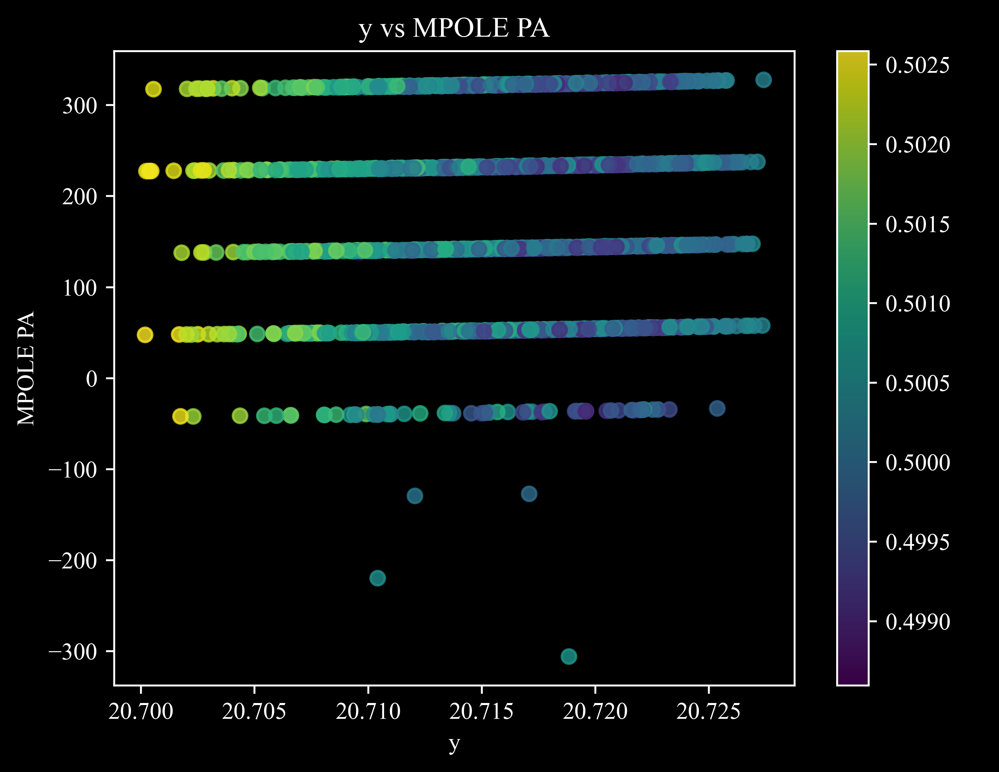

In [24]:
plt.scatter(filtered_df['y'], filtered_df['t_mpole_pa'], c=filtered_df['r_ein'], alpha=0.8)
plt.colorbar(label='Ellipticity')
plt.xlabel('y', color = 'w')
plt.ylabel('MPOLE PA', color = 'w')
plt.title('y vs MPOLE PA')
plt.show()

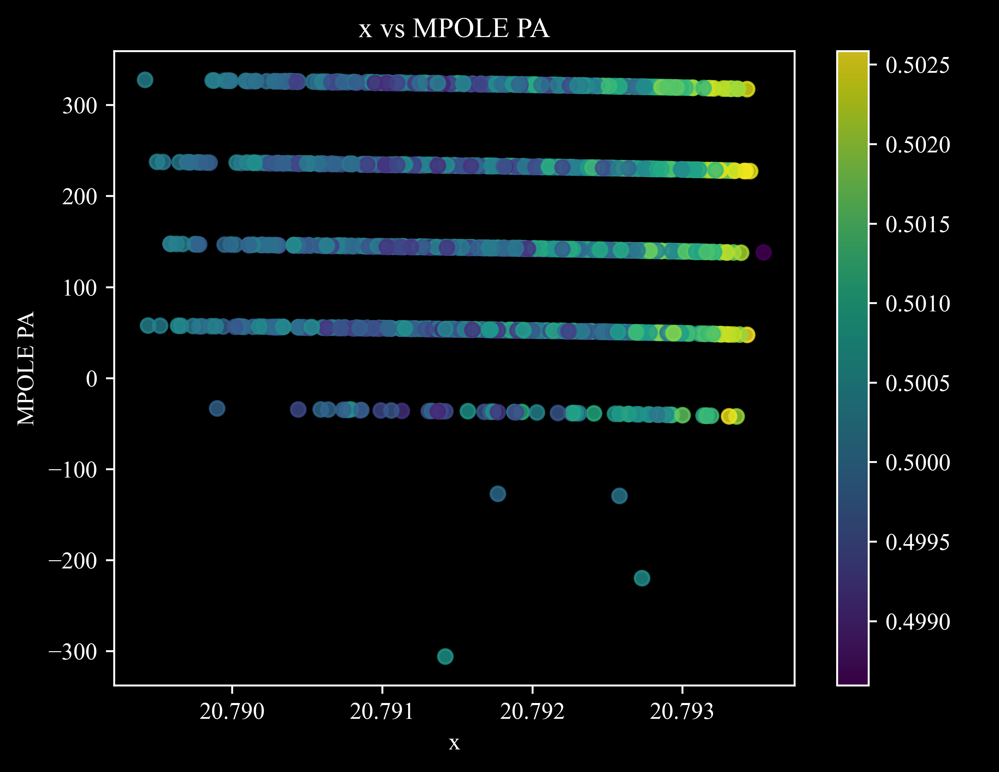

In [25]:
plt.scatter(filtered_df['x'], filtered_df['t_mpole_pa'], c=filtered_df['r_ein'], alpha=0.8)
plt.colorbar(label='Einstein Radius')
plt.xlabel('x', color = 'w')
plt.ylabel('MPOLE PA', color = 'w')
plt.title('x vs MPOLE PA')
plt.show()

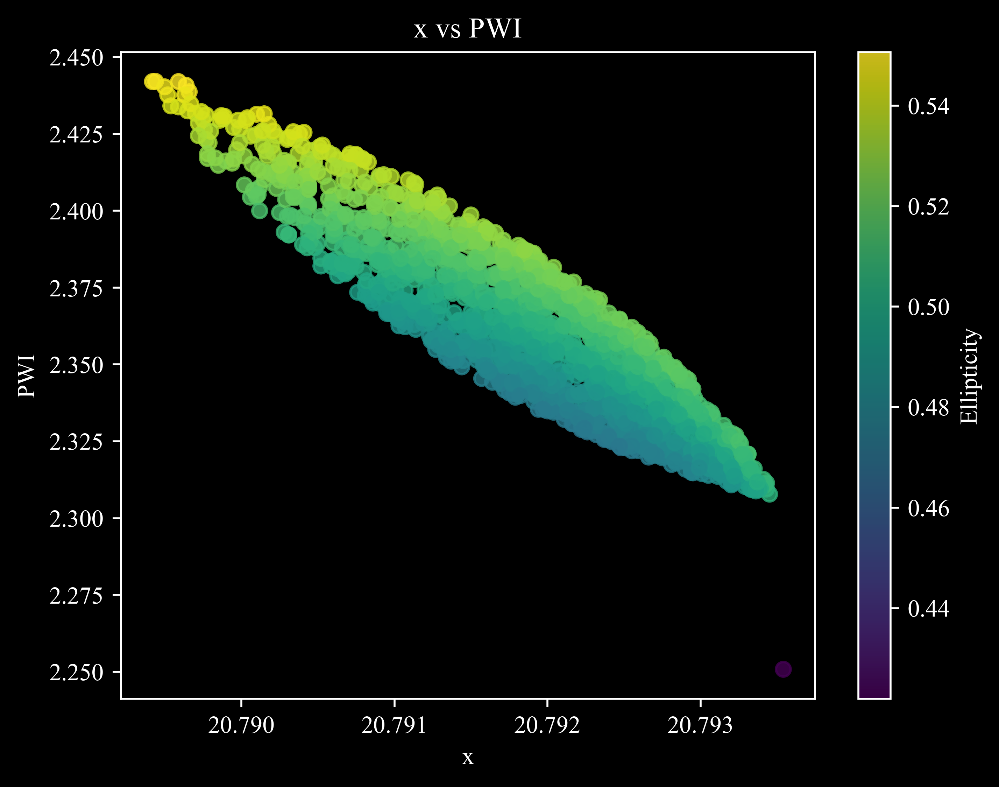

In [45]:
plt.scatter(filtered_df['x'], filtered_df['pwi'], c=filtered_df['e'], alpha=0.8)
plt.colorbar(label='Ellipticity')
plt.xlabel('x', color = 'w')
plt.ylabel('PWI', color = 'w')
plt.title('x vs PWI')
plt.show()

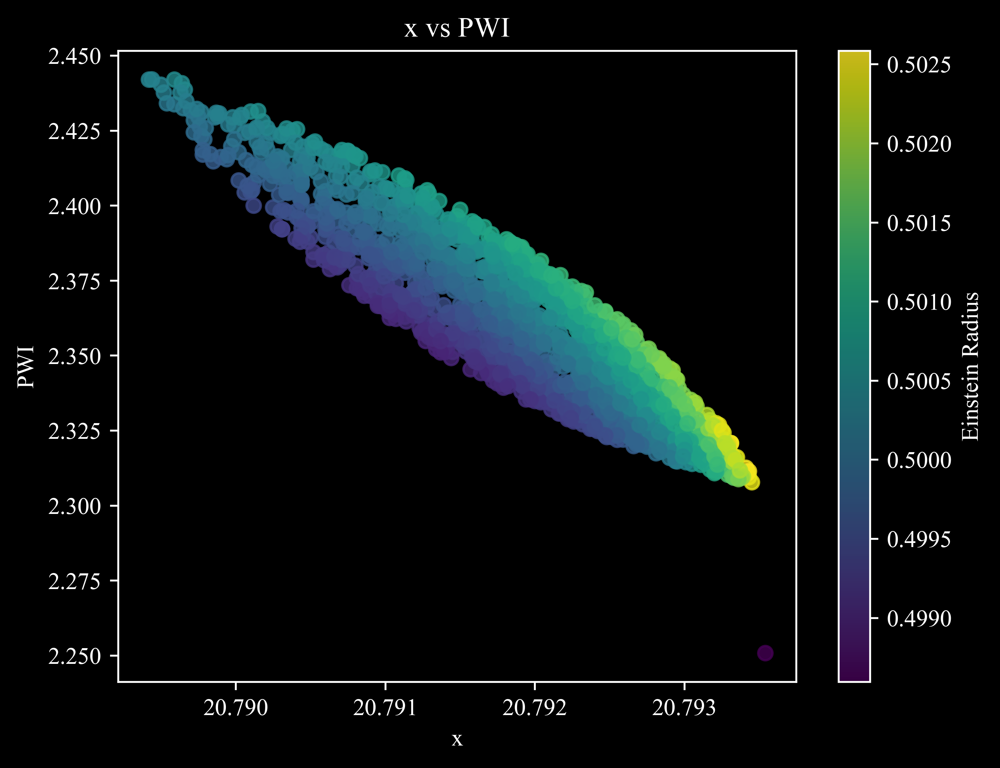

In [47]:
plt.scatter(filtered_df['x'], filtered_df['pwi'], c=filtered_df['r_ein'], alpha=0.8)
plt.colorbar(label='Einstein Radius')
plt.xlabel('x', color = 'w')
plt.ylabel('PWI', color = 'w')
plt.title('x vs PWI')
plt.show()

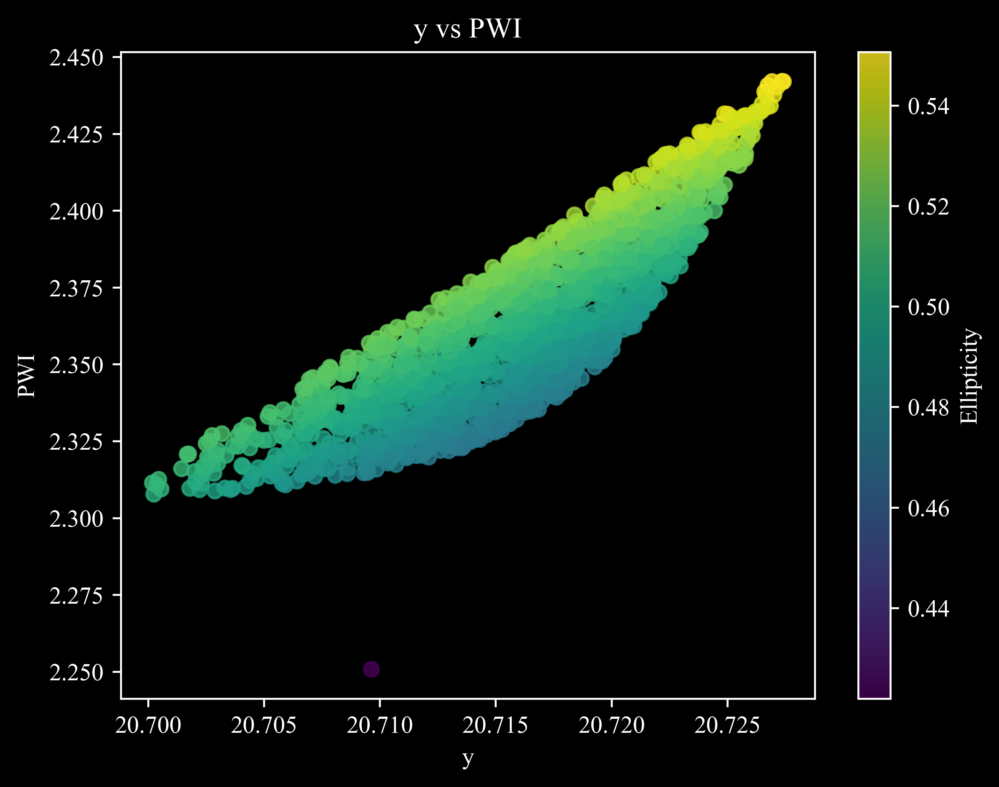

In [48]:
plt.scatter(filtered_df['y'], filtered_df['pwi'], c=filtered_df['e'], alpha=0.8)
plt.colorbar(label='Ellipticity')
plt.xlabel('y', color = 'w')
plt.ylabel('PWI', color = 'w')
plt.title('y vs PWI')
plt.show()

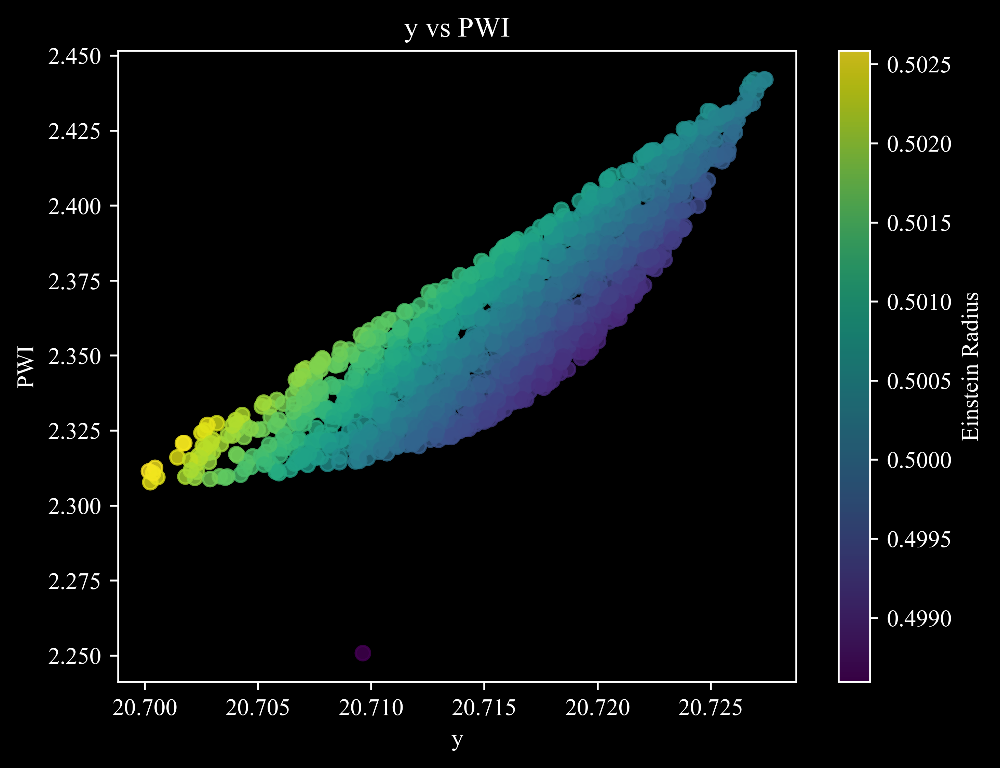

In [49]:
plt.scatter(filtered_df['y'], filtered_df['pwi'], c=filtered_df['r_ein'], alpha=0.8)
plt.colorbar(label='Einstein Radius')
plt.xlabel('y', color = 'w')
plt.ylabel('PWI', color = 'w')
plt.title('y vs PWI')
plt.show()